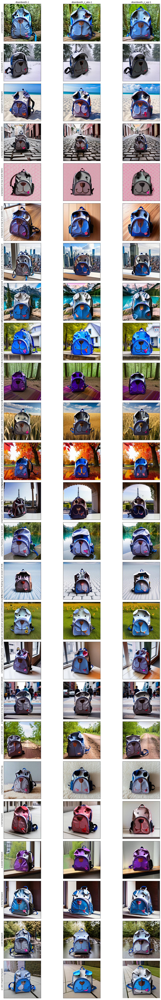

In [1]:
import argparse
import matplotlib.pyplot as plt
from PIL import Image
import os
import json
from pathlib import Path
import argparse
import shlex


parser = argparse.ArgumentParser("Utility to make tables with generated samples")
parser.add_argument("--methods", nargs="+")
parser.add_argument("--concept")
parser.add_argument("--prompts", nargs="+", default=["all"])
parser.add_argument("--checkpoints", required=False, nargs="+")
# parser.add_argument("--out", type=Path, default=Path("images/table.jpg"))
args = parser.parse_args(shlex.split("--methods disenbooth-1 disenbooth_c_abs-1 disenbooth_c_sqr-1 "\
                                     "--checkpoints 1800 1800 1800 --concept backpack_dog"))
"--methods disenbooth-1 disenbooth_c_abs-1 disenbooth_c_sqr-1 "\
                                     "--checkpoints 1200 1200 1400 --concept dog"
"--methods disenbooth-1 disenbooth_c_abs-1 disenbooth_c_sqr-1 "\
                            "--checkpoints 2000 1800 1800 --concept can"

assert(args.prompts[0] == 'all')

table = []
prompts = []
for i, method in enumerate(args.methods):    
    table.append([])
    path = Path(f'generated/{method}/{args.concept}/sd2.1/')
    if args.checkpoints is not None and len(args.checkpoints) > i and args.checkpoints[i] != '-':
        path = path / f'checkpoint-{args.checkpoints[i]}'
    with open(path / 'description.json') as file:
        j = json.load(file)
    for i, p in enumerate(j['prompted']):
        prompts.append(p['original_prompt'].replace('a photo of', ''))
        table[-1].append(path / p['images'][0])

R = len(table[0])
C = len(table)
px = 1/plt.rcParams['figure.dpi']
fig,ax = plt.subplots(R, C)#, figsize=((1 + R) * 512, (1 + C) * 512))
plt.axis('off')

for c in range(C):
    for r in range(R):
        image = Image.open(table[c][r])
        ax[r][c].imshow(image)

        fig.axes[r * C + c].get_xaxis().set_ticks([])
        fig.axes[r * C + c].get_yaxis().set_ticks([])
        ax[r][c].figure.set_size_inches(R * 3.2, R * 3.2)
        if r == 0:
            ax[r][c].set_title(args.methods[c])
        if c == 0:
            ax[r][c].set_ylabel(prompts[r]) # f'{r + 1}.' + 

for i in range(7):
    fig.tight_layout()
plt.show()
# plt.savefig(args.out, dpi=fig.dpi)